In [1]:
using DelimitedFiles
using Plots

# preparación

In [2]:
dir_apo_out ="/home/pbarletta/labo/20/reobp/run/apo/pre/outputs";
dir_apo ="/home/pbarletta/labo/20/reobp/run/apo/pre";

In [3]:
# Leo minimizaciones
for i in [1 3 4 5]
    global apo_min_Etot = readdlm(joinpath(dir_apo_out, string("Etot_min_", i)))[:, 2]
    sym_apo_min_Etot = Symbol("apo_min_Etot_", i)
    eval(:($sym_apo_min_Etot = apo_min_Etot))
end

# Leo dinámicas
apo_equ_den = Array{Float64, 1}()
for i in [2 6 7 8 9]
    global apo_md_ek = readdlm(joinpath(dir_apo_out, string(i, "_ektot.dat")))[:, 2]
    global apo_md_ep = readdlm(joinpath(dir_apo_out, string(i, "_eptot.dat")))[:, 2]
    global apo_md_et = readdlm(joinpath(dir_apo_out, string(i, "_etot.dat")))[:, 2]
    
    sym_apo_md_ek = Symbol("apo_md_ek_", i)
    sym_apo_md_ep = Symbol("apo_md_ep_", i)
    sym_apo_md_et = Symbol("apo_md_et_", i)
    
    eval(:($sym_apo_md_ek = apo_md_ek))
    eval(:($sym_apo_md_ep = apo_md_ep))
    eval(:($sym_apo_md_et = apo_md_et))
    
    if i != 2
        append!(apo_equ_den, readdlm(joinpath(dir_apo_out, string(i, 
                        "_density.dat")))[:, 2])
    end
end

# Leo equilibración final
apo_equ_ek = readdlm(joinpath(dir_apo_out,  "equ_ektot.dat"))[:, 2]
apo_equ_ep = readdlm(joinpath(dir_apo_out,  "equ_eptot.dat"))[:, 2]
apo_equ_et = readdlm(joinpath(dir_apo_out,  "equ_etot.dat"))[:, 2]
apo_equ_tem = readdlm(joinpath(dir_apo_out, "equ_temp.dat"))[:, 2]
append!(apo_equ_den, readdlm(joinpath(dir_apo_out, "equ_density.dat"))[:, 2]);

### Step 1: Initial minimization of mobile molecules

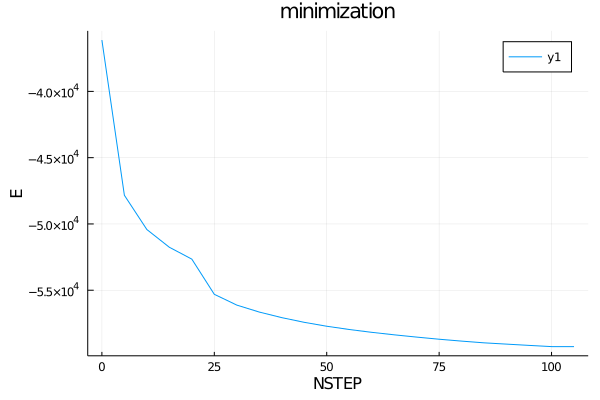

In [4]:
ntpr = 5
NSTEPS = ntpr * length(apo_min_Etot_1)
x = collect(0:5:NSTEPS-1)

plot(x, apo_min_Etot_1,
    title = "minimization",
    yaxis = "E", xaxis = "NSTEP")

### Step 2: Initial relaxation of mobile molecules

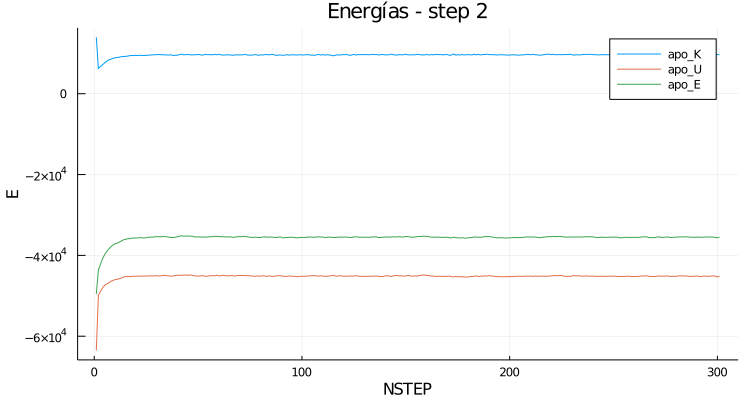

In [5]:
plot(apo_md_ek_2,
    label = "apo_K", title = "Energías - step 2", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_md_ep_2, label = "apo_U")
plot!(apo_md_et_2, label = "apo_E")

### Step 3: Initial minimization of large molecules

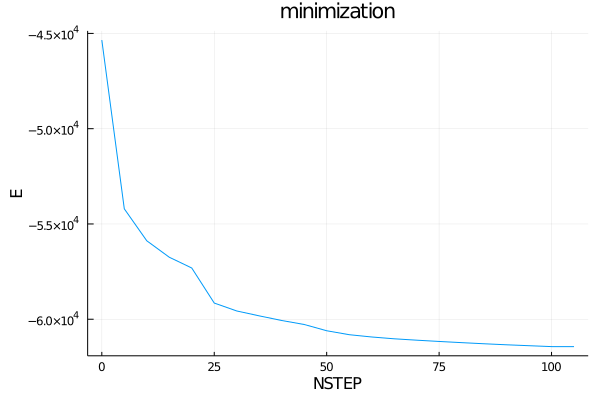

In [6]:
ntpr = 5
NSTEPS = ntpr * length(apo_min_Etot_3)
x = collect(0:5:NSTEPS-1)

plot(x, apo_min_Etot_3,
    label = false, title = "minimization",
    yaxis = "E", xaxis = "NSTEP")

### Step 4: Continued minimization of large molecules

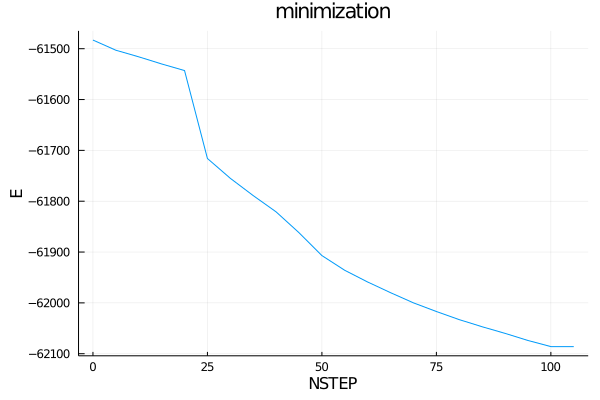

In [7]:
ntpr = 5
NSTEPS = ntpr * length(apo_min_Etot_4)
x = collect(0:5:NSTEPS-1)

plot(x, apo_min_Etot_4,
    label = false, title = "minimization",
    yaxis = "E", xaxis = "NSTEP")

### Step 5: Final minimization of the system

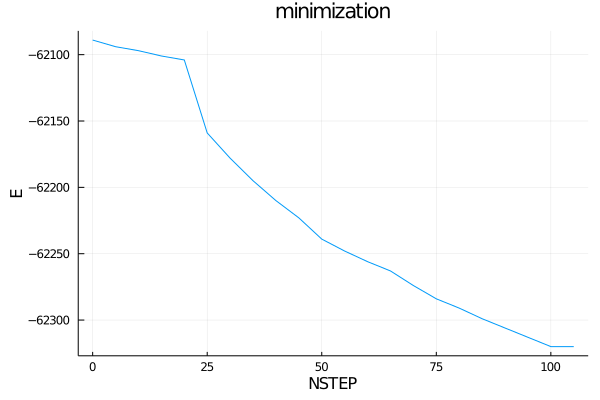

In [8]:
ntpr = 5
NSTEPS = ntpr * length(apo_min_Etot_5)
x = collect(0:5:NSTEPS-1)

plot(x, apo_min_Etot_5,
    label = false, title = "minimization",
    yaxis = "E", xaxis = "NSTEP")

### Step 6: Initial relaxation of large molecules

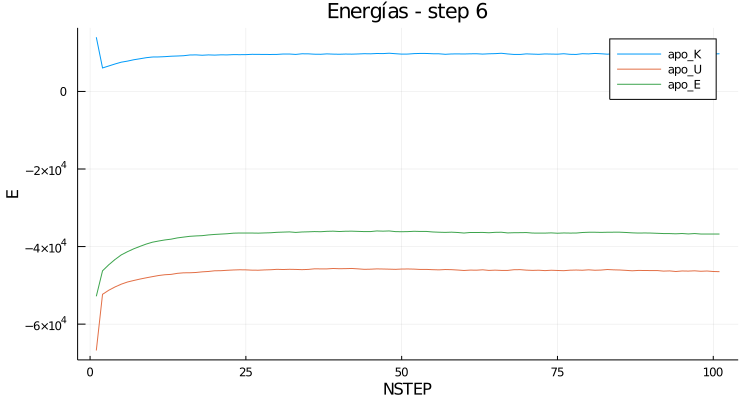

In [9]:
plot(apo_md_ek_6,
    label = "apo_K", title = "Energías - step 6", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_md_ep_6, label = "apo_U")
plot!(apo_md_et_6, label = "apo_E")

### Step 7: Continued relaxation of large molecules

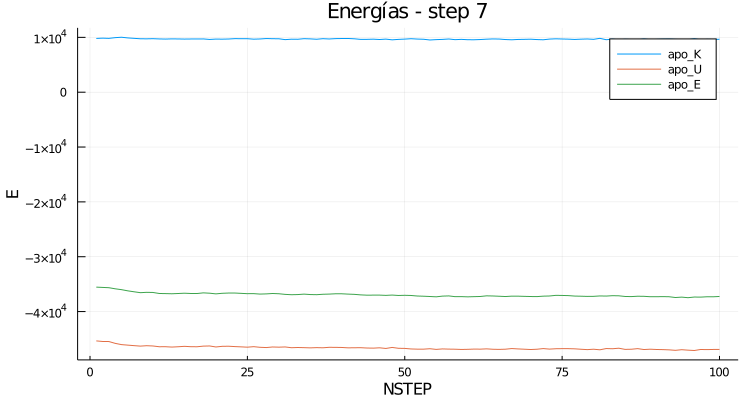

In [10]:
plot(apo_md_ek_7,
    label = "apo_K", title = "Energías - step 7", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_md_ep_7, label = "apo_U")
plot!(apo_md_et_7, label = "apo_E")

### Step 8: Relaxation of non-backbone atoms

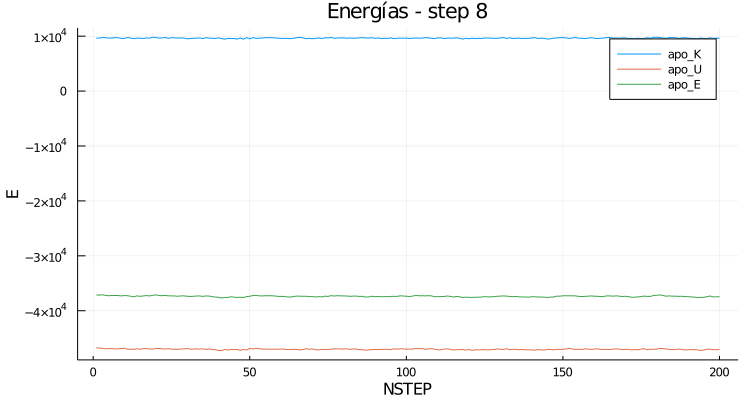

In [11]:
plot(apo_md_ek_8,
    label = "apo_K", title = "Energías - step 8", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_md_ep_8, label = "apo_U")
plot!(apo_md_et_8, label = "apo_E")

### Step 9: Unrestrained relaxation

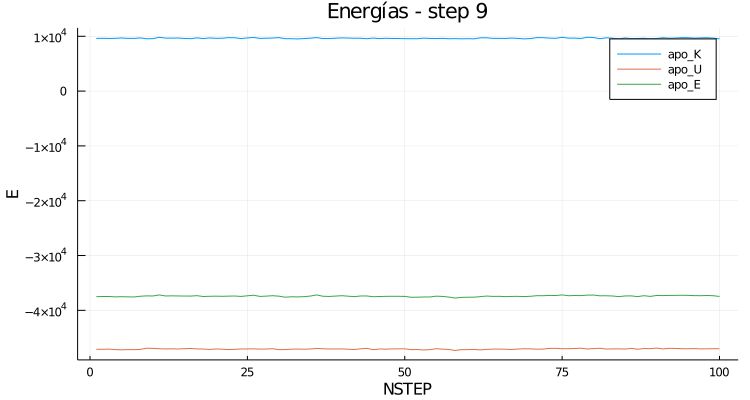

In [12]:
plot(apo_md_ek_9,
    label = "apo_K", title = "Energías - step 9", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_md_ep_9, label = "apo_U")
plot!(apo_md_et_9, label = "apo_E")

### Step 10: Final density stabilization

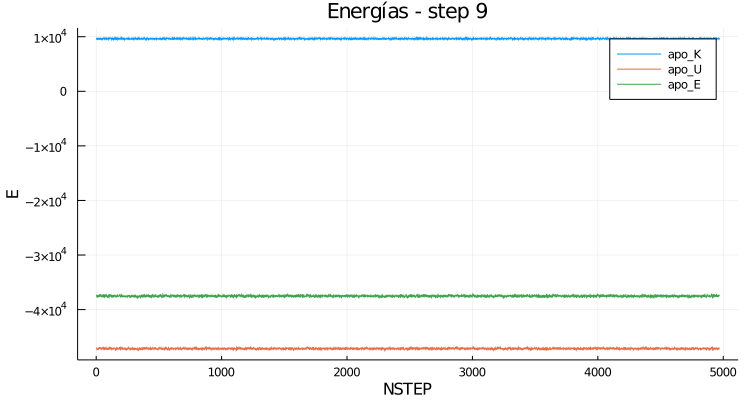

In [13]:
plot(apo_equ_ek,
    label = "apo_K", title = "Energías - step 9", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_equ_ep, label = "apo_U")
plot!(apo_equ_et, label = "apo_E")

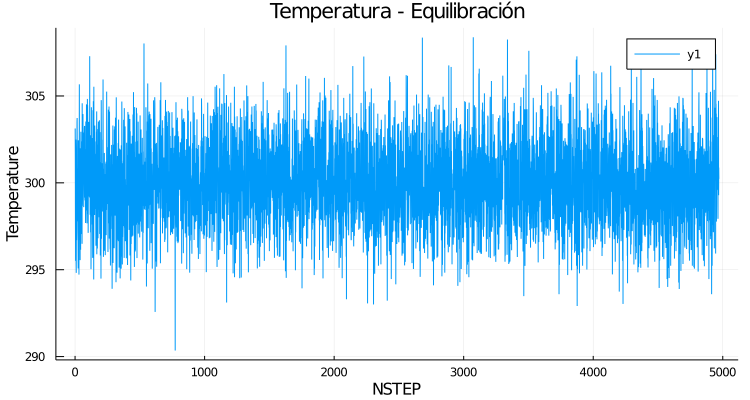

In [14]:
plot(apo_equ_tem,
    title = "Temperatura - Equilibración", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

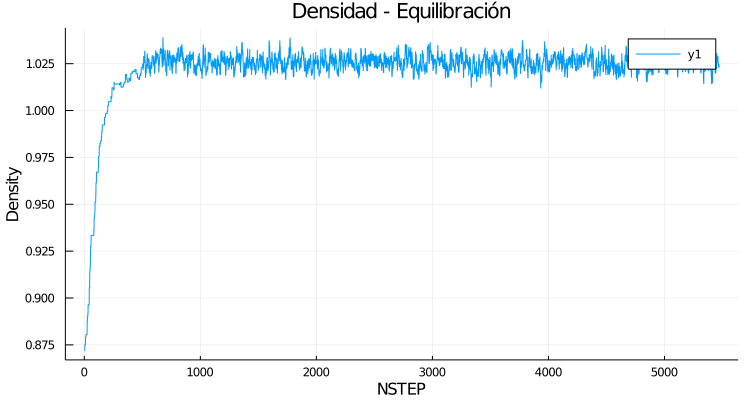

In [15]:
plot(apo_equ_den,
    title = "Densidad - Equilibración", size = (750, 400),
    yaxis = "Density", xaxis = "NSTEP")

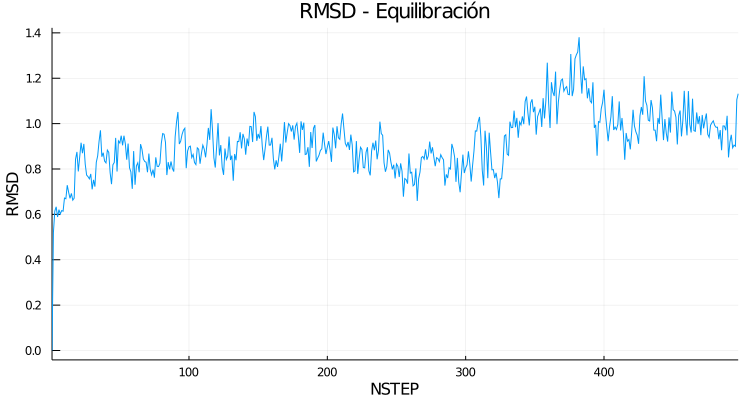

In [16]:
apo_equ_rmsd = readdlm(joinpath(dir_apo, "rmsd_equ_apo"))[2:end, 2]

plot(apo_equ_rmsd,
    xlims = (1, length(apo_equ_rmsd)),
    xticks = 0:1E2:length(apo_equ_rmsd), yticks = 0:.2:2.,
    label = false, title = "RMSD - Equilibración", size = (750, 400),
    yaxis = "RMSD", xaxis = "NSTEP")

# production

In [2]:
# Energias y temp.s. Los archivos tienen nombre de pH, pero en realidad es por índice de réplica. No fueron reordenados
phs = [ 2.0 ; 2.5 ; 3.0 ; 3.5 ; 4.0 ; 4.5 ; 5.0 ; 5.5 ; 6.0 ; 6.5 ; 7.0 ; 7.5 ]
dir_apo_pdt = "/home/pbarletta/labo/20/reobp/run/apo/pdt"
for i in 1:12
    global apo_pdt_KE = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "ektot.dat")))[2:end, 2]
    global apo_pdt_PE = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "eptot.dat")))[2:end, 2]
    global apo_pdt_TE = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "etot.dat")))[2:end, 2]
    global apo_pdt_T = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "temp.dat")))[2:end, 2]
    
    
    sym_apo_pdt_KE_idx = Symbol("apo_pdt_KE_", i)
    sym_apo_pdt_PE_idx = Symbol("apo_pdt_PE_", i)
    sym_apo_pdt_TE_idx = Symbol("apo_pdt_TE_", i)
    sym_apo_pdt_T_idx = Symbol("apo_pdt_T_", i)
    
    eval(:($sym_apo_pdt_KE_idx = apo_pdt_KE))
    eval(:($sym_apo_pdt_PE_idx = apo_pdt_PE))
    eval(:($sym_apo_pdt_TE_idx = apo_pdt_TE))
    eval(:($sym_apo_pdt_T_idx = apo_pdt_T))
end

## 1

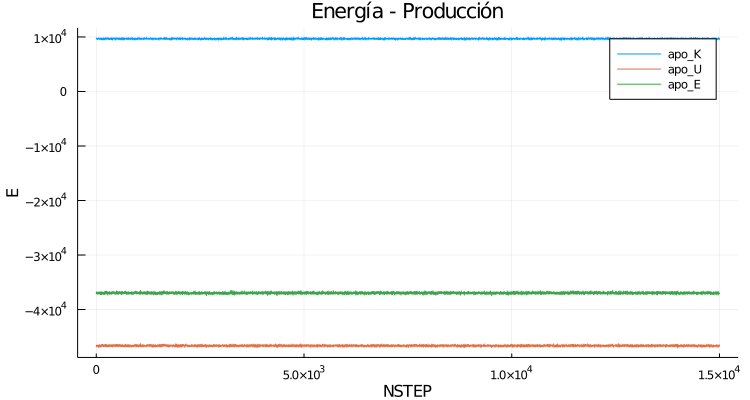

In [3]:
plot(apo_pdt_KE_1,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_1, label = "apo_U")
plot!(apo_pdt_TE_1, label = "apo_E")

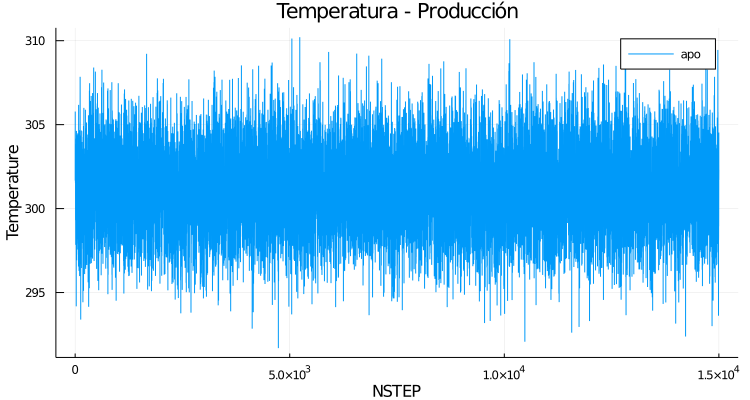

In [4]:
plot(apo_pdt_T_1,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 2

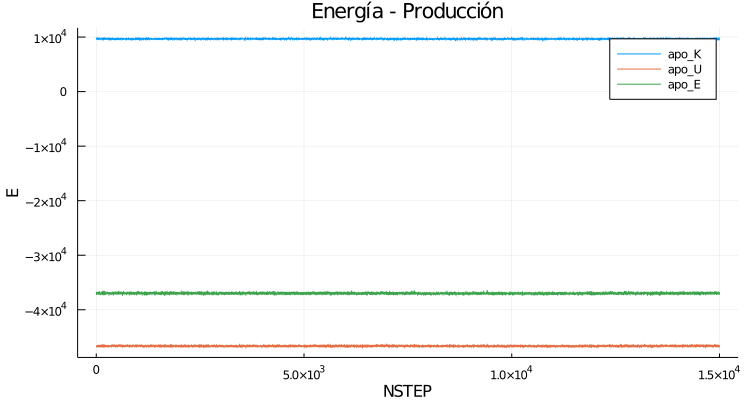

In [5]:
plot(apo_pdt_KE_2,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_2, label = "apo_U")
plot!(apo_pdt_TE_2, label = "apo_E")

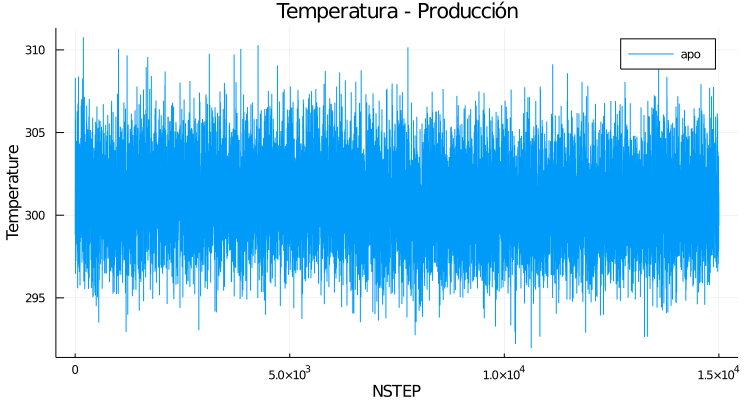

In [6]:
plot(apo_pdt_T_2,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 3

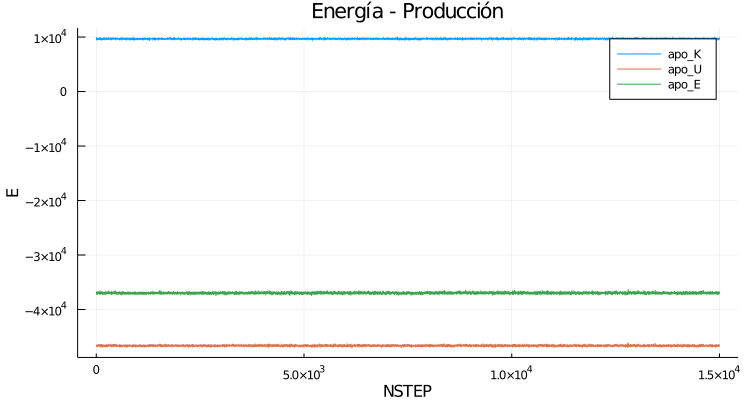

In [7]:
plot(apo_pdt_KE_3,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_3, label = "apo_U")
plot!(apo_pdt_TE_3, label = "apo_E")

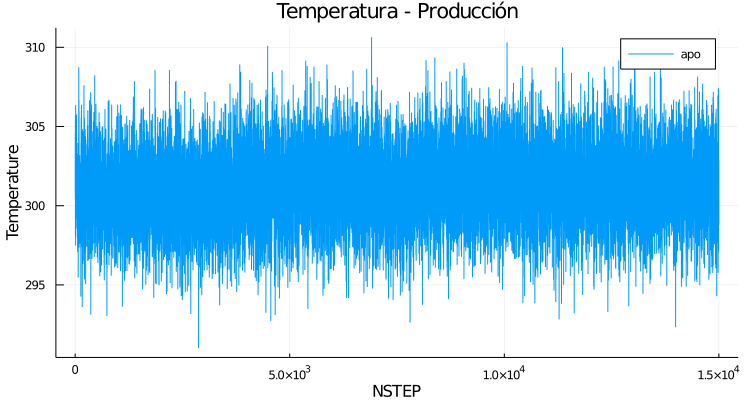

In [8]:
plot(apo_pdt_T_3,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 4

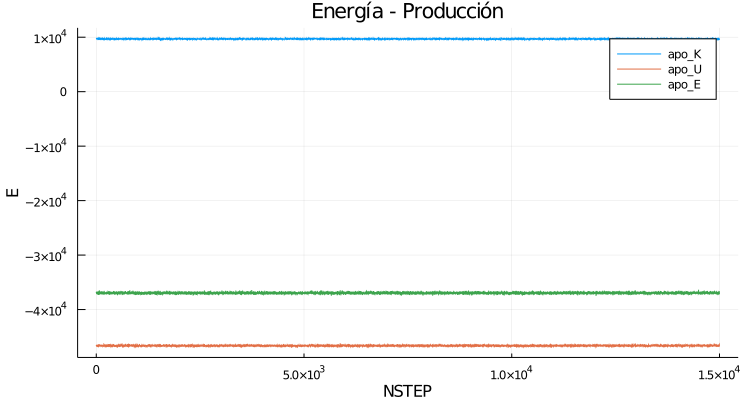

In [9]:
plot(apo_pdt_KE_4,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_4, label = "apo_U")
plot!(apo_pdt_TE_4, label = "apo_E")

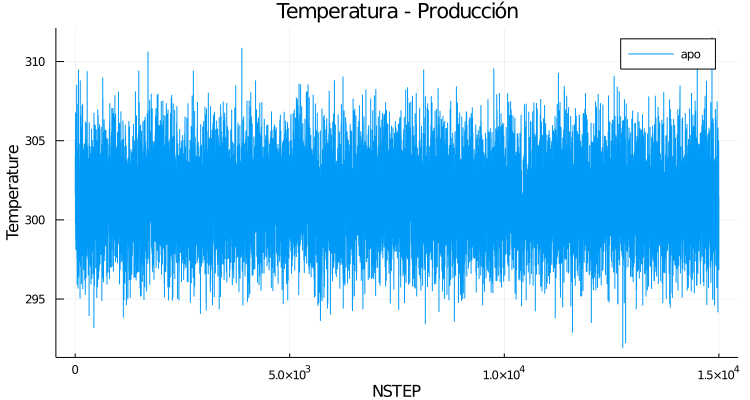

In [10]:
plot(apo_pdt_T_4,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 5

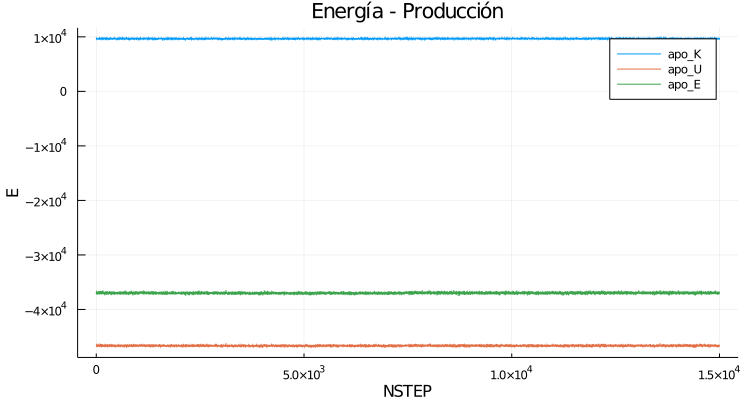

In [11]:
plot(apo_pdt_KE_5,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_5, label = "apo_U")
plot!(apo_pdt_TE_5, label = "apo_E")

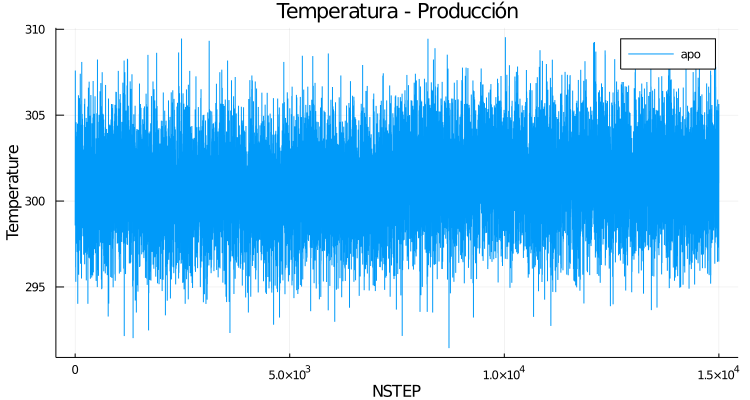

In [12]:
plot(apo_pdt_T_5,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 6

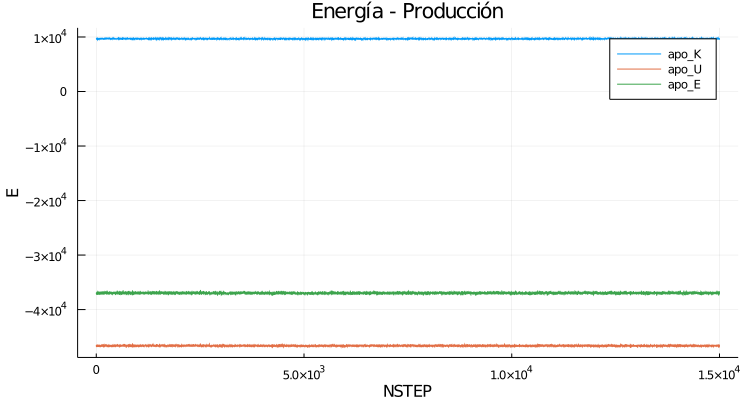

In [13]:
plot(apo_pdt_KE_6,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_6, label = "apo_U")
plot!(apo_pdt_TE_6, label = "apo_E")

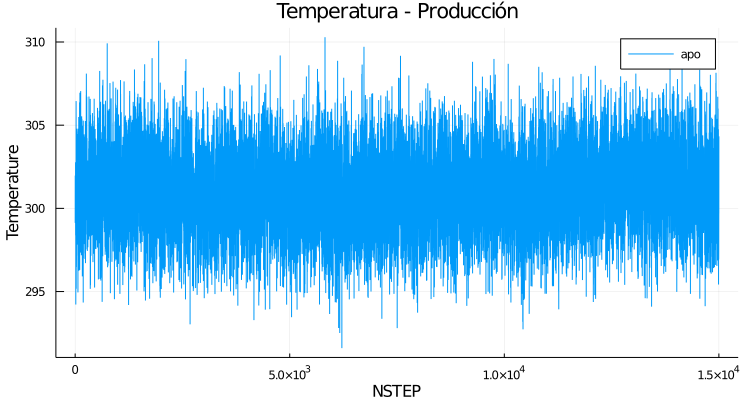

In [14]:
plot(apo_pdt_T_6,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 7

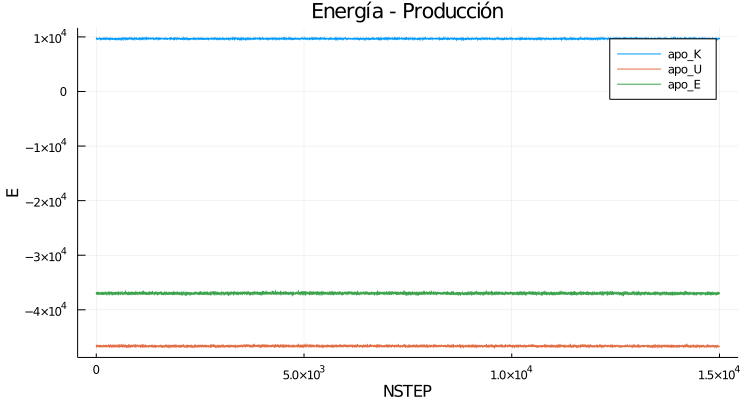

In [15]:
plot(apo_pdt_KE_7,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_7, label = "apo_U")
plot!(apo_pdt_TE_7, label = "apo_E")

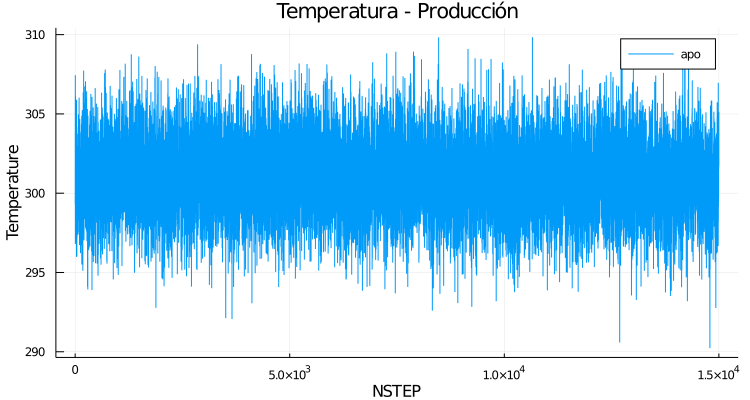

In [16]:
plot(apo_pdt_T_7,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 8

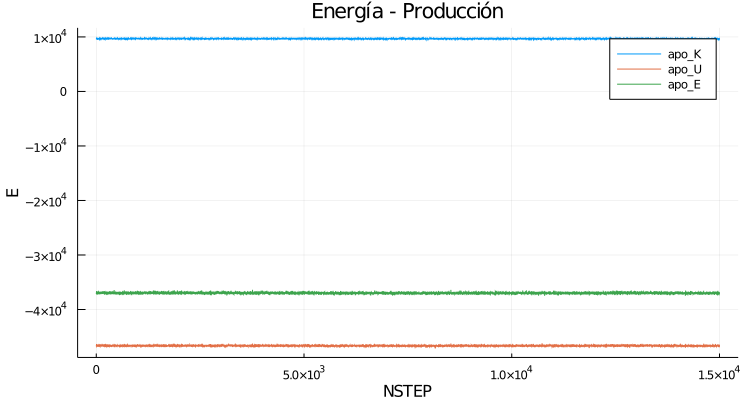

In [17]:
plot(apo_pdt_KE_8,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_8, label = "apo_U")
plot!(apo_pdt_TE_8, label = "apo_E")

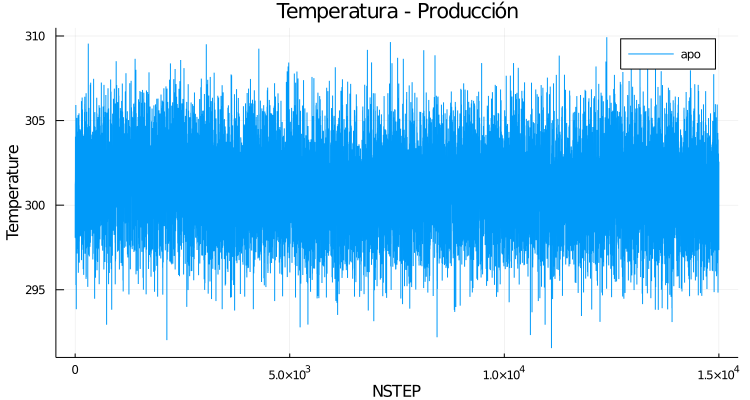

In [18]:
plot(apo_pdt_T_8,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 9

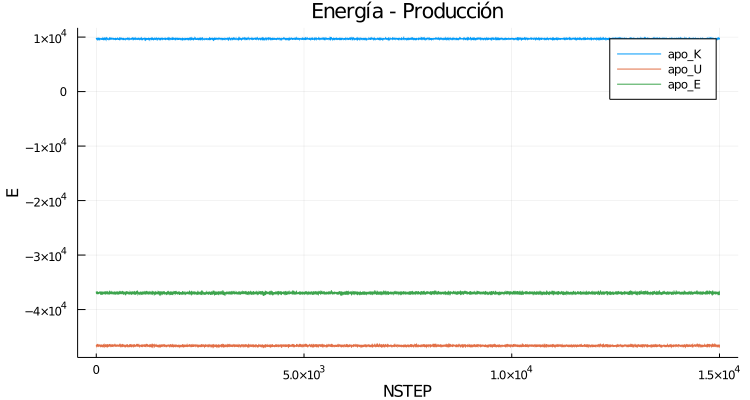

In [19]:
plot(apo_pdt_KE_9,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_9, label = "apo_U")
plot!(apo_pdt_TE_9, label = "apo_E")

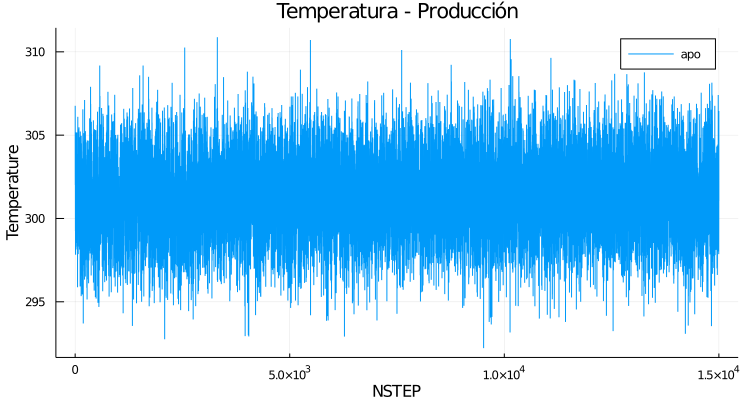

In [20]:
plot(apo_pdt_T_9,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 10

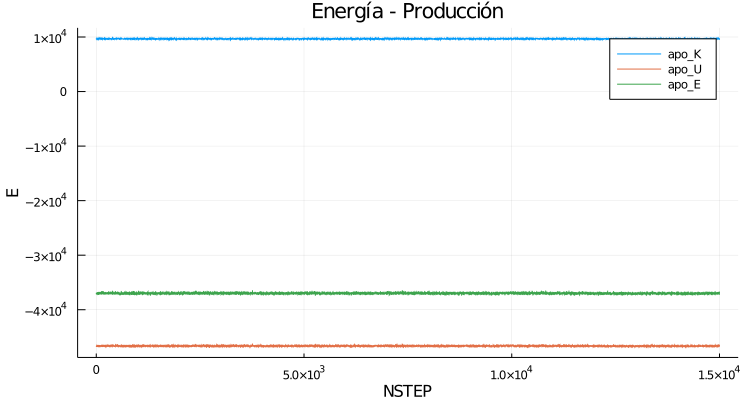

In [21]:
plot(apo_pdt_KE_10,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_10, label = "apo_U")
plot!(apo_pdt_TE_10, label = "apo_E")

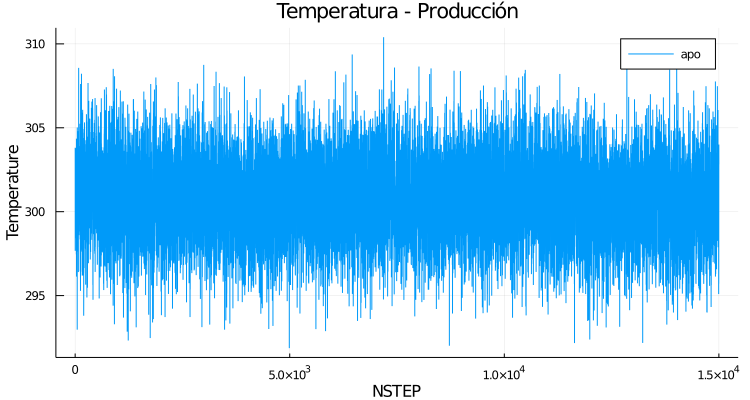

In [22]:
plot(apo_pdt_T_10,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 11

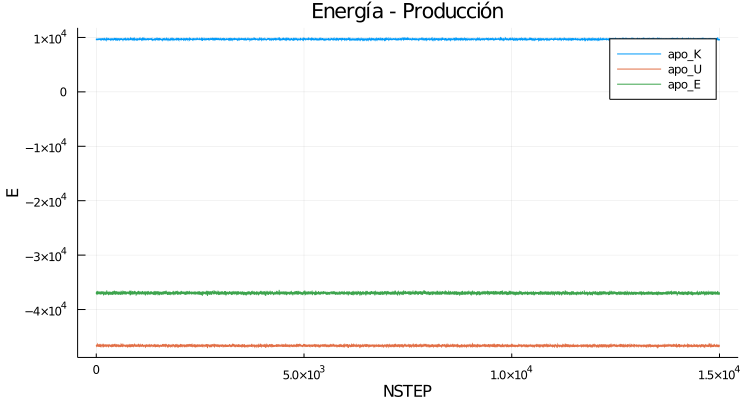

In [23]:
plot(apo_pdt_KE_11,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_11, label = "apo_U")
plot!(apo_pdt_TE_11, label = "apo_E")

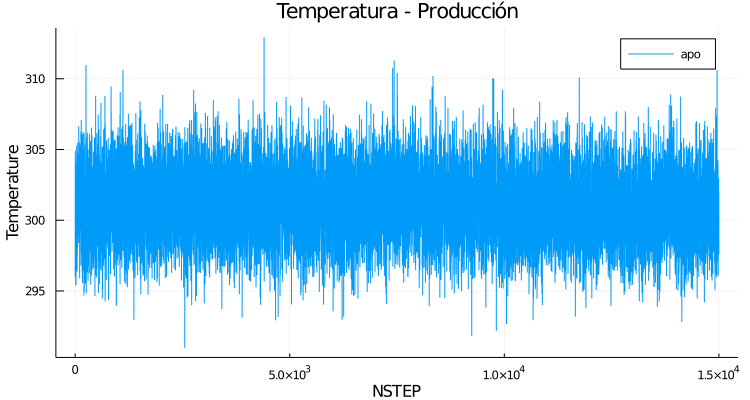

In [24]:
plot(apo_pdt_T_11,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 12

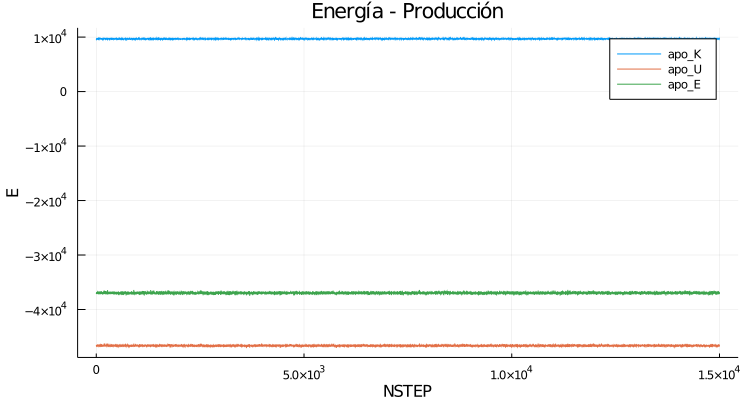

In [25]:
plot(apo_pdt_KE_12,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_12, label = "apo_U")
plot!(apo_pdt_TE_12, label = "apo_E")


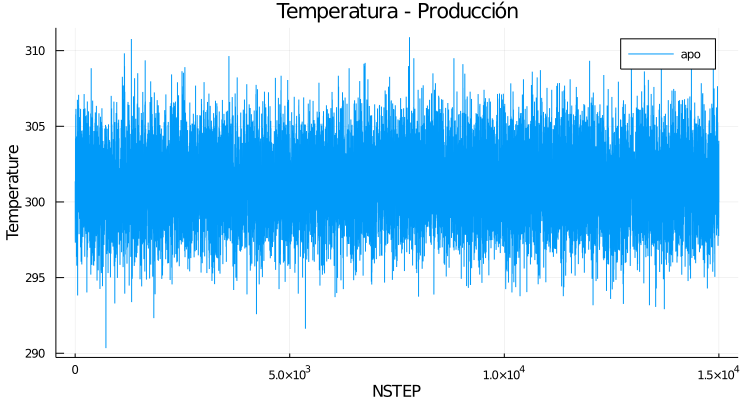

In [26]:
plot(apo_pdt_T_12,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")